#### Bejing Air quality

- paper : Liang, X., Zou, T., Guo, B., Li, S., Zhang, H., Zhang, S., Huang, H. and Chen, S. X. (2015). Assessing Beijing's PM2.5 pollution: severity, weather impact, APEC and winter heating. Proceedings of the Royal Society A, 471, 20150257.

- url = https://www.researchgate.net/publication/283768238_Assessing_Beijing's_PM_25_pollution_severity_weather_impact_APEC_and_winter_heating/link/566ec41008ae1a797e407521/download

- describe : This hourly data set contains the PM2.5 data of US Embassy in Beijing. Meanwhile, meteorological data from Beijing Capital International Airport are also included.

- period : 2010 ~ 2014

- attribute
    - No: row number
    - year: year of data in this row
    - month: month of data in this row
    - day: day of data in this row
    - hour: hour of data in this row
    - pm2.5: PM2.5 concentration (ug/m^3) <- fine particular matter, target value(미세먼지)
    - DEWP: Dew Point (â„ƒ)
    - TEMP: Temperature (â„ƒ)
    - PRES: Pressure (hPa)
    - cbwd: Combined wind direction
    - Iws: Cumulated wind speed (m/s)
    - Is: Cumulated hours of snow
    - Ir: Cumulated hours of rain
    
- reference(korean)
    - https://news.joins.com/Digitalspecial/285

#### 논문 초록

- adjust PM2.5 concentration 를 통계적 방법으로 접근
- 모델로 두가지 실험
    - APEC
    - 겨울 난방
    
- coal-based 가 문제라고 하고 그린하게 하려면 뭐 줄여라 이런 얘기

### 결론

- 논문을 미리 읽고 했으면 시각화에 더 중점을 두었을 듯.
- 아마 다시 건드릴 듯 하다...





- 데이터 처리
    - resample 과정에서 date time 유형 맞춰주는 과정에서 시간 오래걸림(5~6시간?)
    - mp2.5인 값 전부 제거(일 평균 근접값으로 보정해서 돌려주면 좀 나아졌을까?
    

- 분석
    - 시계열 분석
        - stationary 파악 
            - stationary 가 약하게 존재
        - MA, AR 모형 그리고 차수 결정
            - AR(2) 모형 선택.
            - 상관성이 없어서 하나 마나 인듯..ㅠ
        - 차수 결정 모형 생성
            - 모형 생성, 상수항 제거 하여 p-value 0으로 만든 모형 사용
        - 생성 모형 fitting 후 prediction
            - predction 그래프가 한 차원씩 뒤로 밀려 보인다.
            - 공부를 더 해보고 그려봐야 할듯.
    - 회귀분석
        - 왜 했지... ㅠ


- 결론
    - 얻은 점
        - datetime 데이터 처리
            - resample 관련 처리
        - 시계열 분석 방법과 개념
    - 아쉬운 점
        - 데이터 처리를 그렇게 했는데 아직도 헤메고 있다.
        - 회귀분석과 시계열 말고 다른 방법도 있지 않을까?

In [52]:
import missingno as msno
import pprint

# 분석 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
from datetime import datetime

# 시계열
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARIMA

# 회귀
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error
from statsmodels.stats.outliers_influence import variance_inflation_factor #VIF

#pd.set_option('display.max_rows', 40) # max_row
pd.set_option("display.max_columns", None) # max_columns

In [3]:
data = pd.read_csv('PRSA_data_2010.1.1-2014.12.31.csv')


In [4]:
air_data = data
air_data.shape

(43824, 13)

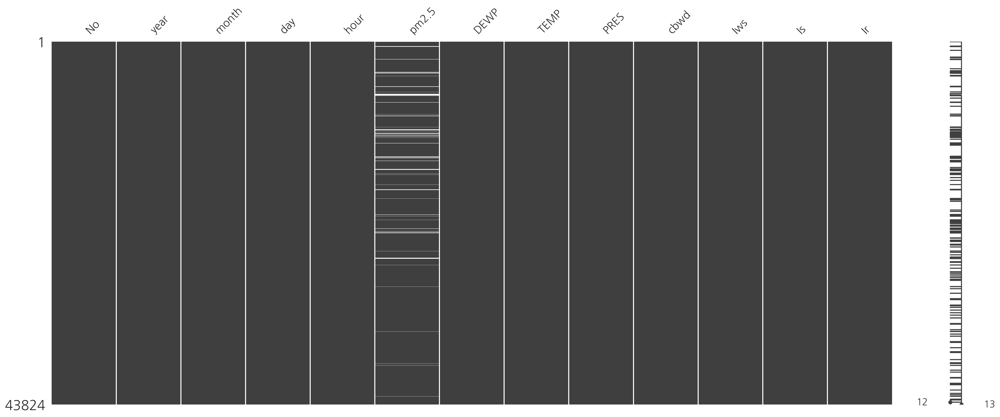

In [5]:
# explore missing data
msno.matrix(air_data);
# find some missing data and count

In [6]:
air_data.isnull().sum()

No          0
year        0
month       0
day         0
hour        0
pm2.5    2067
DEWP        0
TEMP        0
PRES        0
cbwd        0
Iws         0
Is          0
Ir          0
dtype: int64

In [7]:
air_data.describe()

,No,year,month,day,hour,pm2.5,DEWP,TEMP,PRES,Iws,Is,Ir
count,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,41757.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000,43824.000000
mean,21912.500000,2012.000000,6.523549,15.727820,11.500000,98.613215,1.817246,12.448521,1016.447654,23.889140,0.052734,0.194916
std,12651.043435,1.413842,3.448572,8.799425,6.922266,92.050387,14.433440,12.198613,10.268698,50.010635,0.760375,1.415867
min,1.000000,2010.000000,1.000000,1.000000,0.000000,0.000000,-40.000000,-19.000000,991.000000,0.450000,0.000000,0.000000
25%,10956.750000,2011.000000,4.000000,8.000000,5.750000,29.000000,-10.000000,2.000000,1008.000000,1.790000,0.000000,0.000000
50%,21912.500000,2012.000000,7.000000,16.000000,11.500000,72.000000,2.000000,14.000000,1016.000000,5.370000,0.000000,0.000000
75%,32868.250000,2013.000000,10.000000,23.000000,17.250000,137.000000,15.000000,23.000000,1025.000000,21.910000,0.000000,0.000000
max,43824.000000,2014.000000,12.000000,31.000000,23.000000,994.000000,28.000000,42.000000,1046.000000,585.600000,27.000000,36.000000


In [8]:
# 결측치 행 확인하기
air_data.loc[air_data.isnull()["pm2.5"] , :].describe()

,No,year,month,day,hour,pm2.5,DEWP,TEMP,PRES,Iws,Is,Ir
count,2067.000000,2067.000000,2067.000000,2067.000000,2067.000000,0.0,2067.000000,2067.000000,2067.000000,2067.000000,2067.0,2067.000000
mean,14500.882922,2011.135946,6.721335,16.582487,11.453314,NaN,3.172230,13.397194,1016.543783,24.341500,0.0,0.195936
std,9939.950337,1.063975,3.327515,9.035230,6.871390,NaN,14.365588,12.627719,9.600510,57.390592,0.0,1.368934
min,1.000000,2010.000000,1.000000,1.000000,0.000000,NaN,-27.000000,-18.000000,996.000000,0.450000,0.0,0.000000
25%,6454.500000,2010.000000,4.000000,8.000000,6.000000,NaN,-8.000000,4.000000,1009.000000,1.790000,0.0,0.000000
50%,11589.000000,2011.000000,8.000000,19.000000,11.000000,NaN,6.000000,16.000000,1016.000000,5.370000,0.0,0.000000
75%,21936.500000,2012.000000,9.000000,24.000000,17.000000,NaN,15.000000,23.000000,1023.000000,21.460000,0.0,0.000000
max,43553.000000,2014.000000,12.000000,31.000000,23.000000,NaN,27.000000,36.000000,1041.000000,585.600000,0.0,21.000000


In [9]:
########## 최종 데이터 처리 후에 결측치 쳐낸다.
#Drop NaN 
#인근 값으로 결측치를 대체 할까 했는데..
# air_data['pm2.5'].fillna(method='ffill', inplace=True)
# 하루가 통으로 빠진 것도 있어서 일단 다 드롭해보자.
#air_data = air_data.dropna(subset=['pm2.5'], how='any', axis=0) # inplace=True 써도 됨.
#air_data.isnull().sum()

In [10]:
air_data.columns

Index(['No', 'year', 'month', 'day', 'hour', 'pm2.5', 'DEWP', 'TEMP', 'PRES',
       'cbwd', 'Iws', 'Is', 'Ir'],
      dtype='object')

In [11]:
air_data = air_data[['No', 'year', 'month', 'day', 'hour', 'DEWP', 'TEMP', 'PRES',
       'cbwd', 'Iws', 'Is', 'Ir', 'pm2.5']]

In [12]:
sns.pairplot(air_data)
# 이건 뭐 보이지도 않고....

In [13]:
# 시계열이니 날짜 변환 해주기~~~
# 문자열 데이터로 변환한 후 각 연도,월,일 데이터를 합치고 date time 형식에 맞게 조정 해줘야 한다. 변수 따로따로 해주면 안되는듯..ㅠㅠ
# https://rfriend.tistory.com/498
# https://m.blog.naver.com/PostView.nhn?blogId=wideeyed&logNo=221603462366&proxyReferer=https%3A%2F%2Fwww.google.com%2F

In [14]:
air_data['date3'] = air_data['year'].astype('str') + '-' + air_data['month'].astype('str') + '-' + air_data['day'].astype('str')
air_data.date3

0          2010-1-1
1          2010-1-1
2          2010-1-1
3          2010-1-1
4          2010-1-1
            ...    
43819    2014-12-31
43820    2014-12-31
43821    2014-12-31
43822    2014-12-31
43823    2014-12-31
Name: date3, Length: 43824, dtype: object

In [15]:
# 인덱스 지정 해주기위해 timeindex 처리
idx3 = pd.DatetimeIndex(air_data.date3)
idx3

DatetimeIndex(['2010-01-01', '2010-01-01', '2010-01-01', '2010-01-01',
               '2010-01-01', '2010-01-01', '2010-01-01', '2010-01-01',
               '2010-01-01', '2010-01-01',
               ...
               '2014-12-31', '2014-12-31', '2014-12-31', '2014-12-31',
               '2014-12-31', '2014-12-31', '2014-12-31', '2014-12-31',
               '2014-12-31', '2014-12-31'],
              dtype='datetime64[ns]', name='date3', length=43824, freq=None)

In [16]:
# 시계열 분석을 위해서 date를 index로 잡아줘야 돌아간다..

air_data.index=idx3
air_data.tail(100)

,No,year,month,day,hour,DEWP,TEMP,PRES,cbwd,Iws,Is,Ir,pm2.5,date3
date3,,,,,,,,,,,,,,
2014-12-27,43725,2014,12,27,20,-9,-3.0,1026.0,cv,3.57,0,0,349.0,2014-12-27
2014-12-27,43726,2014,12,27,21,-9,-4.0,1026.0,cv,4.46,0,0,327.0,2014-12-27
2014-12-27,43727,2014,12,27,22,-7,-4.0,1025.0,cv,5.35,0,0,348.0,2014-12-27
2014-12-27,43728,2014,12,27,23,-9,-5.0,1025.0,cv,6.24,0,0,363.0,2014-12-27
2014-12-28,43729,2014,12,28,0,-9,-6.0,1025.0,cv,6.69,0,0,385.0,2014-12-28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2014-12-31,43820,2014,12,31,19,-23,-2.0,1034.0,NW,231.97,0,0,8.0,2014-12-31
2014-12-31,43821,2014,12,31,20,-22,-3.0,1034.0,NW,237.78,0,0,10.0,2014-12-31
2014-12-31,43822,2014,12,31,21,-22,-3.0,1034.0,NW,242.70,0,0,10.0,2014-12-31


In [20]:
# week of year를 구하니 1월1일이 53으로 나온다.
# 53이 나오는 경우 -  첫주가 월요일 혹은 일요일로 세팅이 되어 있다. 1월1일이 그 전 요일 인 경우 53으로 반환. 문제는 없는 걸로 보인다..ㅠㅠ -> 분석에는 큰 의미 없음.. 그냥 알게 된거.
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.Period.strftime.html
air_data['date'] = air_data['year'].astype('str') + '-' + air_data['month'].astype('str') + '-' + air_data['month'].astype('str')+ '-' + air_data['hour'].astype('str')
air_data.date = pd.to_datetime(air_data['date'], format='%Y-%m-%d-%H', errors='raise')
air_data['woy'] = air_data.date.dt.weekofyear
air_data.head()

,No,year,month,day,hour,DEWP,TEMP,PRES,cbwd,Iws,Is,Ir,pm2.5,date3,date,woy
date3,,,,,,,,,,,,,,,,
2010-01-01,1,2010,1,1,0,-21,-11.0,1021.0,NW,1.79,0,0,NaN,2010-1-1,2010-01-01 00:00:00,53
2010-01-01,2,2010,1,1,1,-21,-12.0,1020.0,NW,4.92,0,0,NaN,2010-1-1,2010-01-01 01:00:00,53
2010-01-01,3,2010,1,1,2,-21,-11.0,1019.0,NW,6.71,0,0,NaN,2010-1-1,2010-01-01 02:00:00,53
2010-01-01,4,2010,1,1,3,-21,-14.0,1019.0,NW,9.84,0,0,NaN,2010-1-1,2010-01-01 03:00:00,53
2010-01-01,5,2010,1,1,4,-20,-12.0,1018.0,NW,12.97,0,0,NaN,2010-1-1,2010-01-01 04:00:00,53


#### 시계열 분석 데이터 처리 과정

In [21]:
air_data.columns

Index(['No', 'year', 'month', 'day', 'hour', 'DEWP', 'TEMP', 'PRES', 'cbwd',
       'Iws', 'Is', 'Ir', 'pm2.5', 'date3', 'date', 'woy'],
      dtype='object')

In [22]:
# 결측치 제거
air_data = air_data.dropna(subset=['pm2.5'], how='any', axis=0) # inplace=True 써도 됨.
air_data.shape

(41757, 16)

In [25]:
#resample 함수 사용. datascience 스쿨 참고~
#air_data_re = air_data[['No', 'year', 'month', 'day', 'hour',  'TEMP', 'PRES', 'cbwd', 'Iws', 'Is', 'Ir', 'pm2.5']]
air_data_day = air_data.resample("D").mean()
air_data_week = air_data.resample("W").mean()
air_data_month = air_data.resample("M").mean()
air_data_year = air_data.resample("Y").mean()
air_data_month.head()

,No,year,month,day,hour,DEWP,TEMP,PRES,Iws,Is,Ir,pm2.5,woy
date3,,,,,,,,,,,,,
2010-01-31,364.543645,2010.0,1.0,15.667688,11.519142,-16.776417,-6.364472,1028.532925,39.381133,0.546708,0.000000,90.442573,53.0
2010-02-28,1080.532042,2010.0,2.0,14.500745,11.514158,-13.154993,-1.918033,1023.769001,13.482191,0.132638,0.000000,97.233979,5.0
2010-03-31,1772.352609,2010.0,3.0,15.327221,11.499295,-8.610719,2.983075,1022.173484,24.122863,0.251058,0.110014,94.100141,9.0
2010-04-30,2521.469359,2010.0,4.0,15.540390,11.500000,-3.291086,10.805014,1017.160167,58.074666,0.000000,0.253482,80.029248,13.0
2010-05-31,3250.563094,2010.0,5.0,15.922659,11.419267,7.580733,20.856174,1007.850746,21.602564,0.000000,0.472185,86.899593,18.0


#### 시계열 분석... 
- 잘 될까..?ㅠ

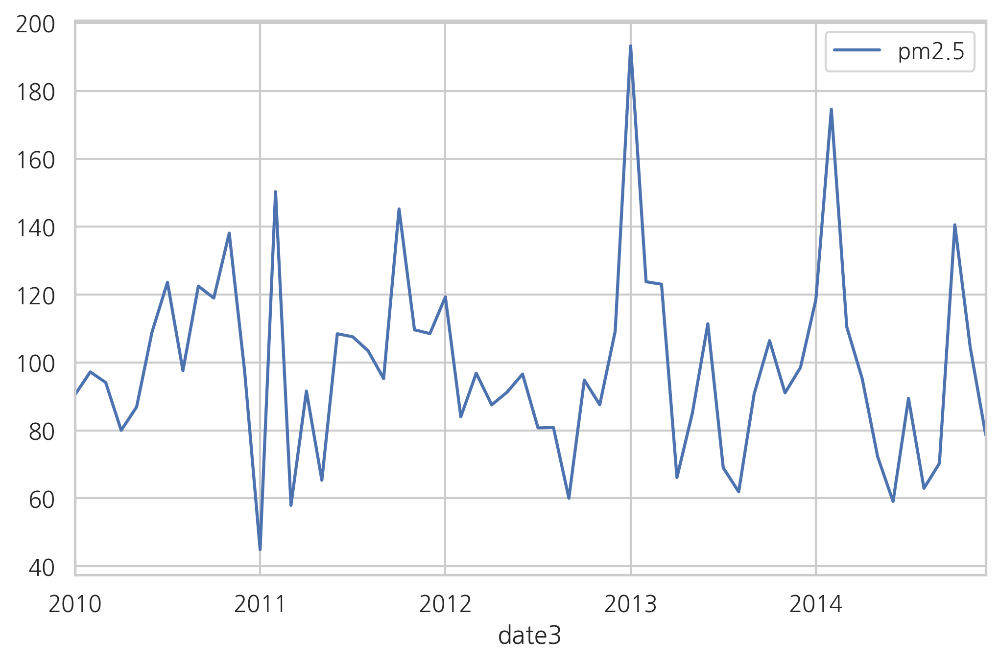

In [26]:
air_data_month.plot( y="pm2.5");

- 월별 변화를 보았을 때
    - 추세 변화가 보이는 것 같다?
        - 근거 : 연초와 연말에 등락이 있어 보이는데.
        - 2011년은 너무 떨어졌다. 1월에 뭐가 있는 것 같은데..ㅠ
        - raw값을 보니 특이한 경향은 없다.. 그때 공기가 좋았나보다..

In [27]:
air_data_month["pm2.5"][12:14]

date3
2011-01-31     44.891369
2011-02-28    150.321429
Freq: M, Name: pm2.5, dtype: float64

In [28]:
air_data["pm2.5"][7980:9000].head(300).describe()
# 2010연말에서 2011초까지 값이 낮게 나온 것으로 파악.. 이상치는 아닌가보다..ㅠ

count    300.000000
mean      48.836667
std       51.872786
min        6.000000
25%       17.000000
50%       23.000000
75%       65.500000
max      286.000000
Name: pm2.5, dtype: float64

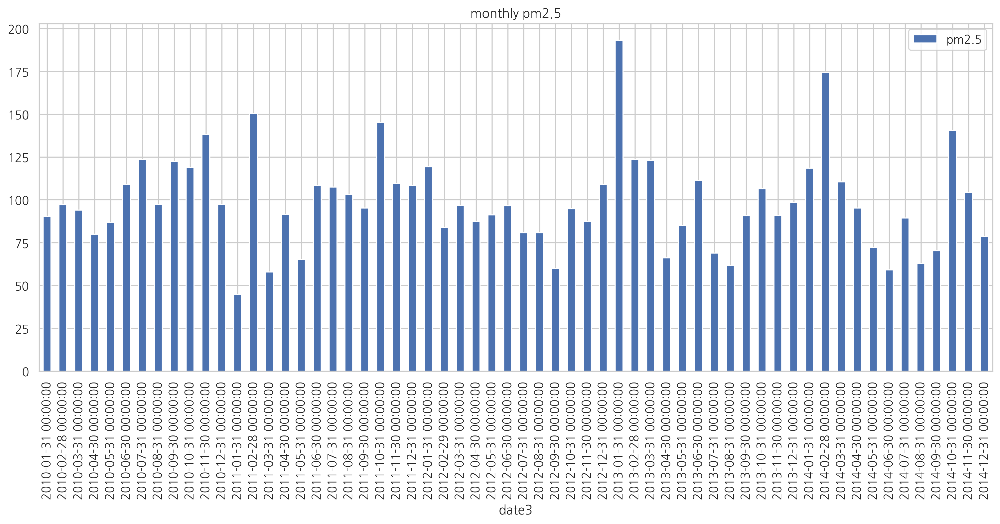

In [29]:
air_data_month.plot( y="pm2.5", kind='bar', figsize=(16,6), title = 'monthly pm2.5');

#### 자기상관성 파악
- AR, MR 차수 파악
- 차분 과정은 이 과정 이후

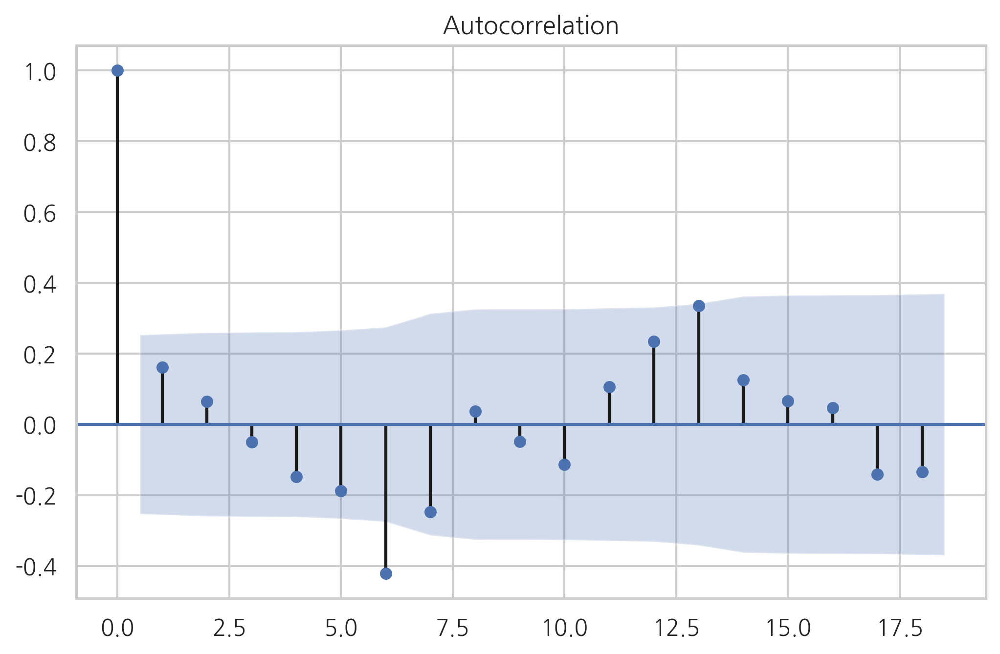

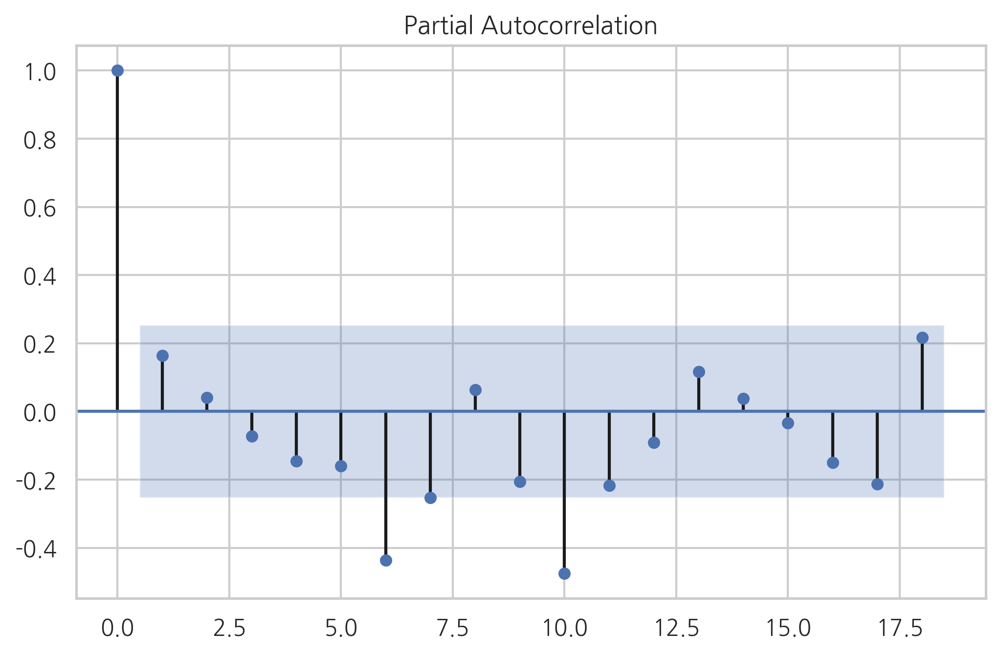

<Figure size 3000x600 with 0 Axes>

In [30]:
#air_data_month_ar = air_data_month["pm2.5"]

plot_acf(air_data_month["pm2.5"])
plot_pacf(air_data_month["pm2.5"])
plt.figure(figsize=(10,2))
plt.show()

- ACF 그래프를 보았을 때 0에서 급격하게 값이 떨어지고 사인 함수 형태를 보여준다.
- PACF 그래프를 보았을 때도 0시점에서 급격하게 값이 떨어지는데 조금씩 감소 하는 것을 보이기는 하는데 마지막이 걸린다...ㅠ
- ARIMA 모형보다는 AR(2) 모형으로 봐야하지 않을까?

In [33]:
air_data_month_ar = air_data_month["pm2.5"]

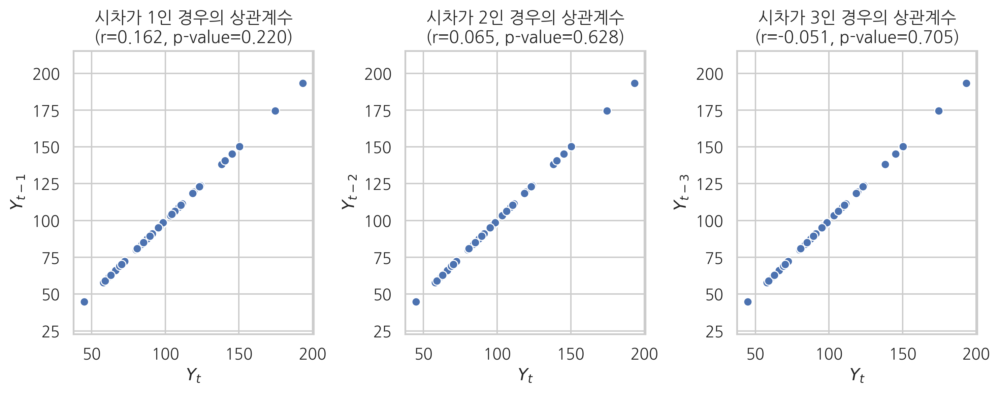

In [34]:
#  상관관계를 그려보자.
plt.figure(figsize=(10, 4))


plt.subplot(131)
r, p = sp.stats.pearsonr(air_data_month_ar[1:], air_data_month_ar[:-1])
sns.scatterplot(air_data_month_ar[1:], air_data_month_ar[:-1])
plt.axis("equal")
plt.xlabel("$Y_t$")
plt.ylabel("$Y_{t-1}$")
plt.title("시차가 1인 경우의 상관계수\n(r={0:.3f}, p-value={1:.3f})".format(r, p))

plt.subplot(132)
r, p = sp.stats.pearsonr(air_data_month_ar[2:], air_data_month_ar[:-2])
sns.scatterplot(air_data_month_ar[2:], air_data_month_ar[:-2])
plt.axis("equal")
plt.xlabel("$Y_t$")
plt.ylabel("$Y_{t-2}$")
plt.title("시차가 2인 경우의 상관계수\n(r={0:.3f}, p-value={1:.3f})".format(r, p))

plt.subplot(133)
r, p = sp.stats.pearsonr(air_data_month_ar[3:], air_data_month_ar[:-3])
sns.scatterplot(air_data_month_ar[3:], air_data_month_ar[:-3])
plt.axis("equal")
plt.xlabel("$Y_t$")
plt.ylabel("$Y_{t-3}$")
plt.title("시차가 3인 경우의 상관계수\n(r={0:.3f}, p-value={1:.3f})".format(r, p))

plt.tight_layout()
plt.show()

In [35]:
# 값이 너무 깔끔하게 나오는데..? 1차 모형이 아닌가..?
# 1차 모형 시뮬레이션..  theta = 0.9
theta = 0.9
ar = [1]
ma = [1, theta]
p1 = sm.tsa.ArmaProcess(ar, ma)

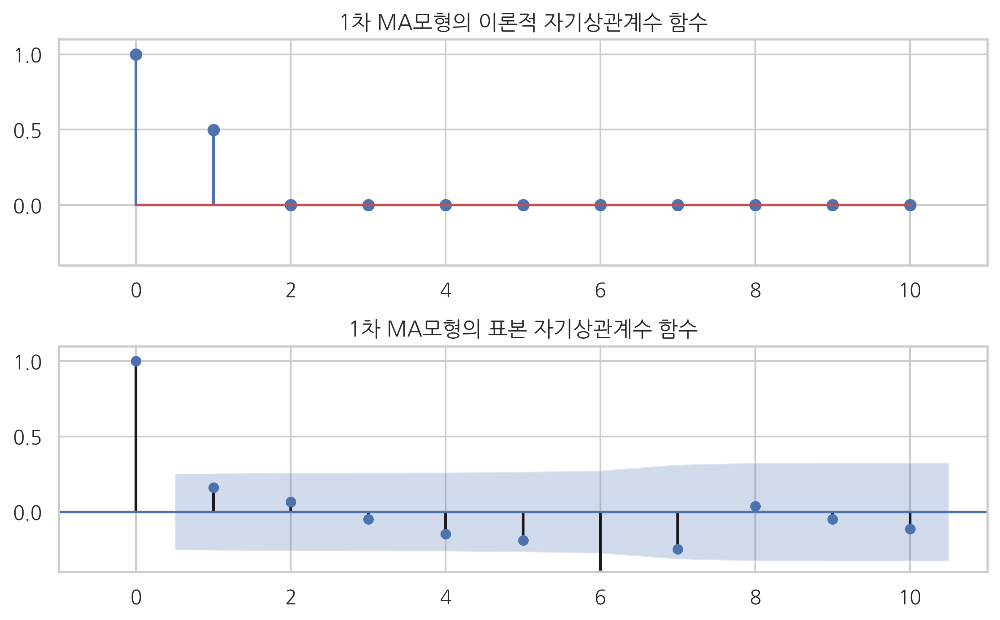

In [36]:
plt.subplot(211)
plt.stem(p1.acf(11))
plt.xlim(-1, 11)
plt.ylim(-0.4, 1.1)
plt.title("1차 MA모형의 이론적 자기상관계수 함수")
ax = plt.subplot(212)
sm.graphics.tsa.plot_acf(air_data_month_ar, lags=10, ax=ax)
plt.xlim(-1, 11)
plt.ylim(-0.4, 1.1)
plt.title("1차 MA모형의 표본 자기상관계수 함수")

plt.tight_layout()
plt.show()

In [37]:
np.random.seed(0)
p2 = sm.tsa.ArmaProcess([1], [1, -1, 0.6])
y2 = p2.generate_sample(100, burnin=10)
#plt.plot(y2, 'o-')
#plt.title("2차 MA모형의 시뮬레이션")
#plt.show()

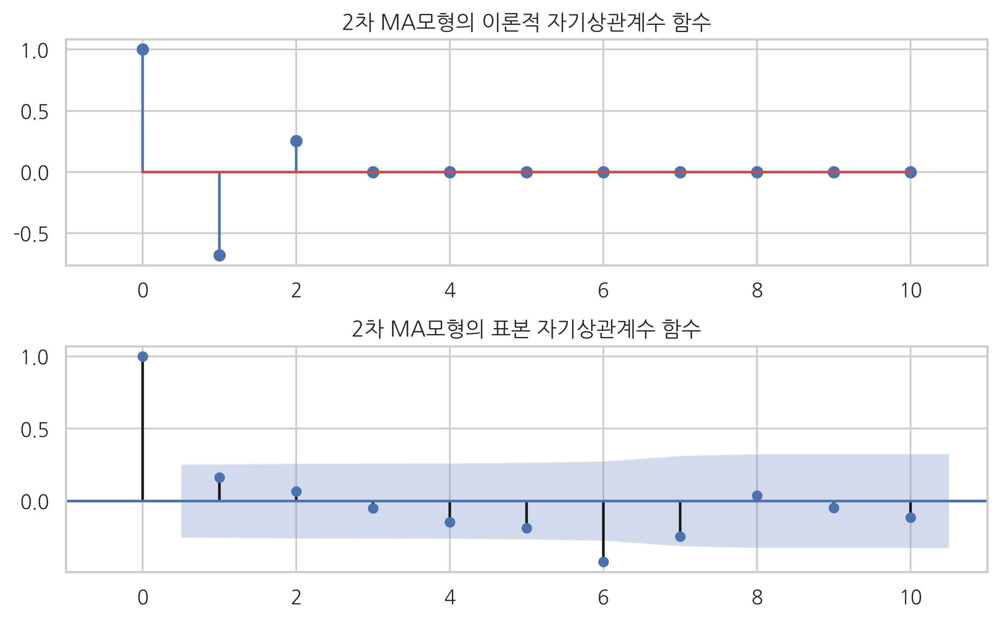

In [38]:
plt.subplot(211)
plt.stem(p2.acf(11))
plt.xlim(-1, 11)
plt.title("2차 MA모형의 이론적 자기상관계수 함수")

ax = plt.subplot(212)
sm.graphics.tsa.plot_acf(air_data_month_ar, lags=10, ax=ax)
plt.xlim(-1, 11)
plt.title("2차 MA모형의 표본 자기상관계수 함수")

plt.tight_layout()
plt.show()

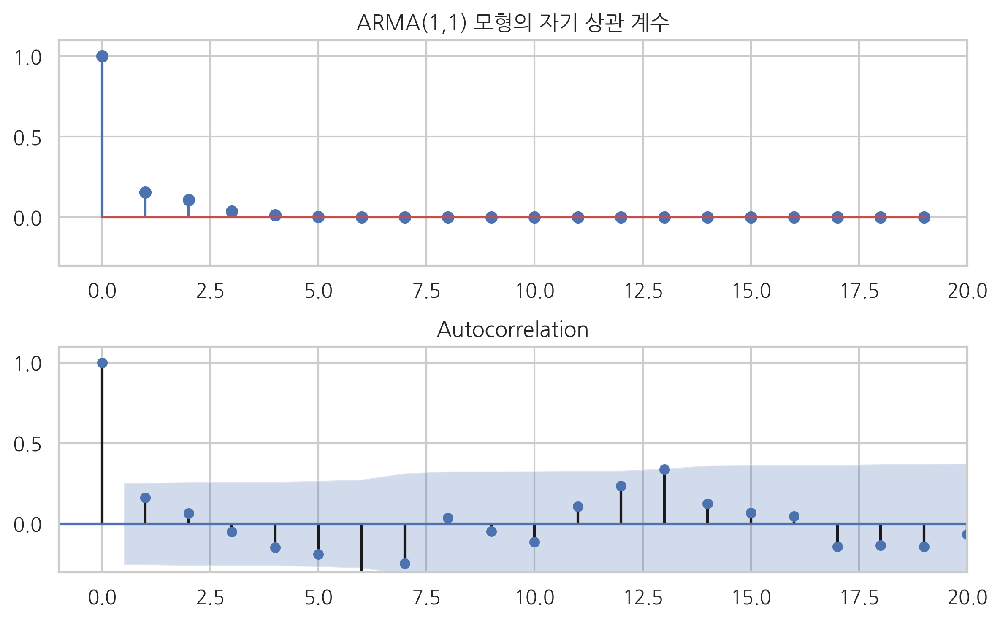

In [39]:
np.random.seed(0)
p1 = sm.tsa.ArmaProcess([2, -0.7], [2, -0.4])
y1 = p1.generate_sample(300, burnin=100)

plt.subplot(211)
plt.stem(p1.acf(20))
plt.xlim(-1, 20)
plt.ylim(-0.3, 1.1)
plt.title("ARMA(1,1) 모형의 자기 상관 계수")

ax = plt.subplot(212)
sm.graphics.tsa.plot_acf(air_data_month_ar, lags=20, ax=ax)
plt.xlim(-1, 20)
plt.ylim(-0.3, 1.1)

plt.tight_layout()
plt.show()

- ARIMA는 답이 없다..
- AR 모형으로 predict 해보기전에 차분을 해보자
- 1,2차 차분 결과를 보니 하지 않는게 좋겠다. 0차!

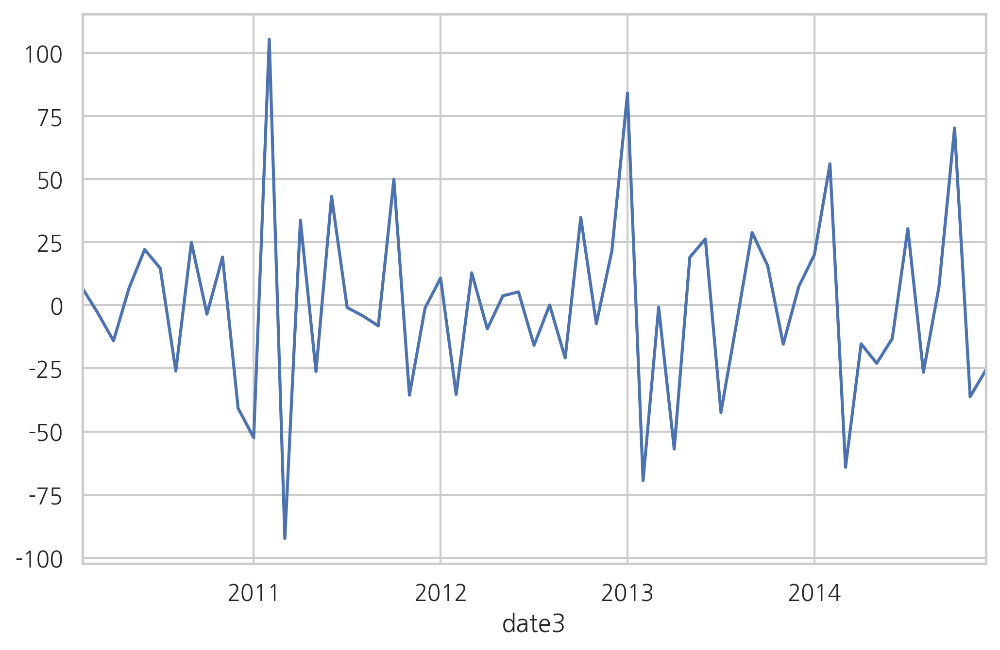

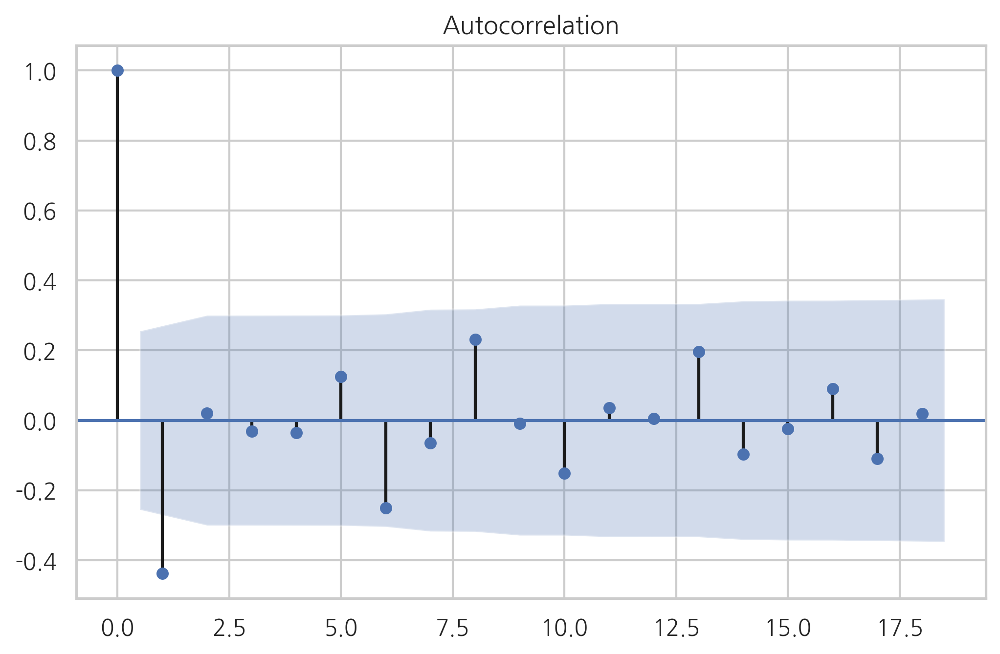

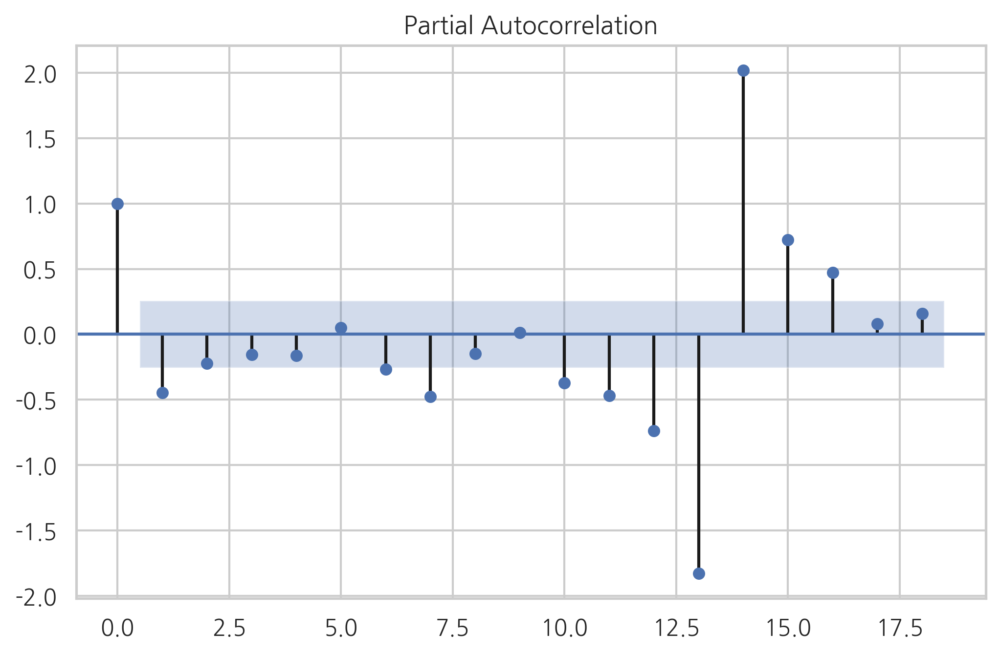

In [40]:
# 차분
diff_1=air_data_month_ar.diff(periods=1).iloc[1:]
diff_1.plot()
plot_acf(diff_1)
plot_pacf(diff_1)
plt.show()

In [43]:
# AR2 fitting
# trend 설정 주의
model = ARIMA(air_data_month_ar, order=(2,0,0))
model_fit = model.fit(trend='nc',full_output=True, disp=1)
print(model_fit.summary())

                              ARMA Model Results                              
Dep. Variable:                  pm2.5   No. Observations:                   60
Model:                     ARMA(2, 0)   Log Likelihood                -293.892
Method:                       css-mle   S.D. of innovations             31.780
Date:                Mon, 30 Mar 2020   AIC                            593.784
Time:                        17:34:58   BIC                            600.067
Sample:                    01-31-2010   HQIC                           596.241
                         - 12-31-2014                                         
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
ar.L1.pm2.5     0.5468      0.116      4.727      0.000       0.320       0.774
ar.L2.pm2.5     0.4151      0.117      3.551      0.000       0.186       0.644
                                    Roots       

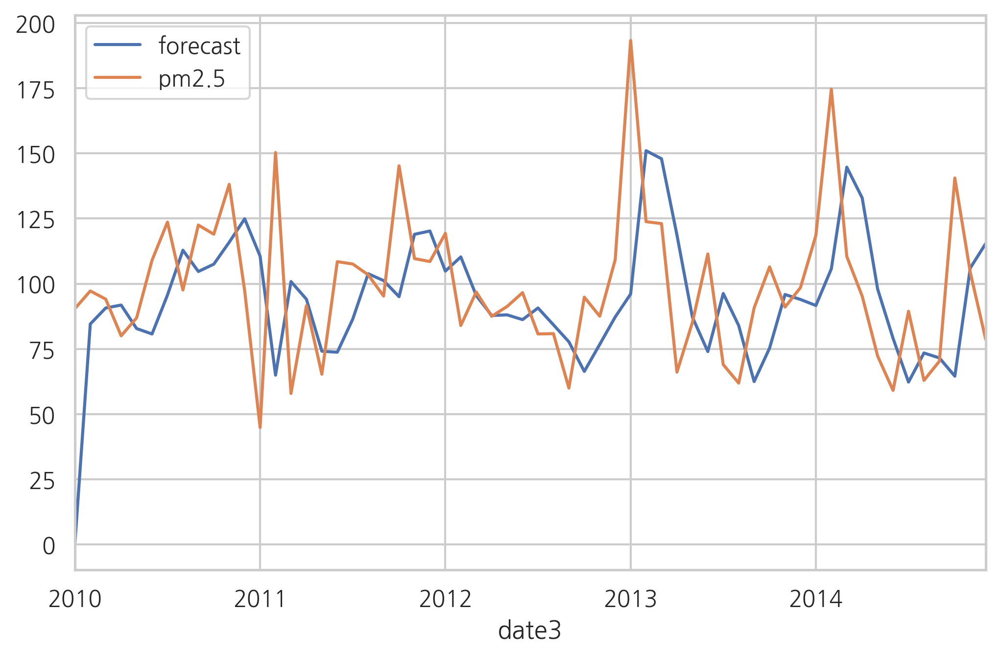

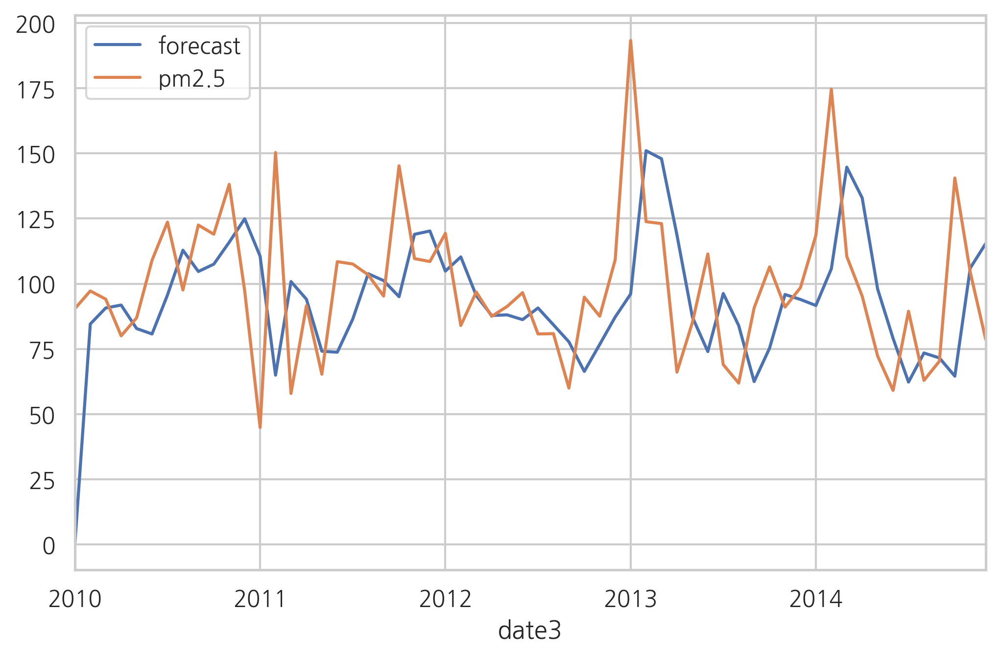

In [44]:
model_fit.plot_predict()


In [45]:
fore = model_fit.forecast(steps=1)
print(fore)

(86.33470486662354, array([31.78012955]), array([[ 24.04679552, 148.62261421]]))


- 아쉬우니 회귀분석도 해보자..."

In [46]:
data = pd.read_csv('PRSA_data_2010.1.1-2014.12.31.csv')
air_data_reg = data
air_data_reg.columns

Index(['No', 'year', 'month', 'day', 'hour', 'pm2.5', 'DEWP', 'TEMP', 'PRES',
       'cbwd', 'Iws', 'Is', 'Ir'],
      dtype='object')

In [47]:
air_data_reg = air_data_reg[['No', 'year', 'month', 'day', 'hour', 'pm2.5', 'DEWP', 'TEMP', 'PRES',
       'cbwd', 'Iws', 'Is', 'Ir']]
air_data_reg = air_data_reg.dropna(subset=['pm2.5'], how='any', axis=0) # inplace=True 써도 됨.
air_data_reg.rename(columns={"pm2.5":"pm",},inplace=True)
train = air_data_reg[(air_data_reg['year'] == 2010) | (air_data_reg['year'] == 2011) | (air_data_reg['year'] == 2012) | (air_data_reg['year'] == 2013) ] 
test = air_data_reg[air_data_reg['year'] == 2014]

In [48]:
# 이건 뭐....
model = sm.OLS.from_formula('pm ~ TEMP + PRES +  Iws +  Ir ', data = train)
result_train = model.fit()
RMSE = mean_squared_error(test['pm'], result_train.predict(test))**0.5
RMSE

88.32051996855097

In [49]:
print(result_train.summary())

                            OLS Regression Results                            
Dep. Variable:                     pm   R-squared:                       0.120
Model:                            OLS   Adj. R-squared:                  0.120
Method:                 Least Squares   F-statistic:                     1130.
Date:                Mon, 30 Mar 2020   Prob (F-statistic):               0.00
Time:                        17:36:31   Log-Likelihood:            -1.9437e+05
No. Observations:               33096   AIC:                         3.888e+05
Df Residuals:                   33091   BIC:                         3.888e+05
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   3420.6202     82.811     41.306      0.0

In [53]:
pd.DataFrame({'column': column, 'VIF': variance_inflation_factor(model.exog, i)} 
             for i, column in enumerate(model.exog_names)
             if column != 'Intercept').sort_values(by = 'VIF',ascending=False)  # 절편의 VIF는 구하지 않는다.
# VIF 값으 낮게 나오네...

,column,VIF
1,PRES,3.186712
0,TEMP,3.139840
2,Iws,1.034289
3,Ir,1.007786
